In [1]:
%matplotlib inline

In [2]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models
import pandas as pd

import copy
import os

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
device

device(type='cuda')

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Loading the Images


In [6]:
# desired size of the output image

def image_loader(image_name):
    imsize = 512 if torch.cuda.is_available() else 128  # use small size if no gpu
    loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor

    image = Image.open(image_name).convert('RGB')
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

In [7]:
 # reconvert into PIL image
plt.ion()

def imshow(tensor, title=None, save=False, label=None):
    unloader = transforms.ToPILImage() 
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.axis("off")
    if save:
      im = image.save(label+".jpg")
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated

## Loss Functions
Content Loss

In [8]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

.. Note::
   **Important detail**: although this module is named ``ContentLoss``, it
   is not a true PyTorch Loss function. If you want to define your content
   loss as a PyTorch Loss function, you have to create a PyTorch autograd function 
   to recompute/implement the gradient manually in the ``backward``
   method.



### Style Loss


In [9]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

Now the style loss module looks almost exactly like the content loss
module. The style distance is also computed using the mean square
error between $G_{XL}$ and $G_{SL}$.




In [10]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [11]:
# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

A ``Sequential`` module contains an ordered list of child modules. For
instance, ``vgg19.features`` contains a sequence (Conv2d, ReLU, MaxPool2d,
Conv2d, ReLU…) aligned in the right order of depth. We need to add our
content loss and style loss layers immediately after the convolution
layer they are detecting. To do this we must create a new ``Sequential``
module that has content loss and style loss modules correctly inserted.




In [12]:
# desired depth layers to compute style/content losses :

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=['conv_4'],
                               style_layers=['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

## Gradient Descent



In [13]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

In [14]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=2000,
                       style_weight=30000, content_weight=15):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 500 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

Finally, we can run the algorithm.




In [31]:
def main():
    ## Input image can be white noise or the content image 
    style_imfolder="/content/drive/MyDrive/CS230-Project/Data/Skin-Tones/"
    content_imfolder="/content/drive/MyDrive/CS230-Project/Data/benign_malignant_data/malignant/"
    train_df = pd.read_csv("/content/drive/MyDrive/CS230-Project/Data/ISIC-subset1/train.csv")

    #Taking only the malignant images 
    train_df = train_df[train_df['target'] == 1]

    cnn = models.vgg19(pretrained=True).features.to(device).eval()
    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    for i in range(60,len(train_df)):
        for j in range(6, 7):
          content_im_path = os.path.join(content_imfolder, train_df.iloc[i]['image_name'] + '.jpg')
          if len(str(j)) == 1:
            style_im_name = 'ST000'+str(j)
          else:
            style_im_name = 'ST00'+str(j)
          style_im_path = os.path.join(style_imfolder, style_im_name +'.png')

          content_img = image_loader(content_im_path)
          style_img= image_loader(style_im_path)
          assert style_img.size() == content_img.size()

          plt.figure()
          imshow(style_img, title='Style Image')
          imshow(content_img, title='Content Image')

          "we need to import style and content images of the same size"
          input_img = content_img.clone()
          output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                  content_img, style_img, input_img)
          plt.figure()
          imshow(output, title='Output Image', save=True, label="/content/drive/MyDrive/CS230-Project/Data/Generated/"+"SDG_"+train_df.iloc[i]['image_name']+"_"+style_im_name)

          # sphinx_gallery_thumbnail_number = 4
          plt.ioff()
          plt.show()

          print("Iteration: Content Image",str(i+1),"Style Image",str(j),"completed.")

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


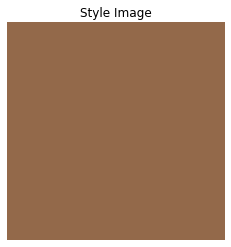

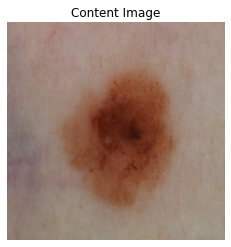

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.


run [500]:
Style Loss : 2.262964 Content Loss: 0.733438

run [1000]:
Style Loss : 2.226494 Content Loss: 0.740631

run [1500]:
Style Loss : 2.202093 Content Loss: 0.744603

run [2000]:
Style Loss : 2.189340 Content Loss: 0.745565



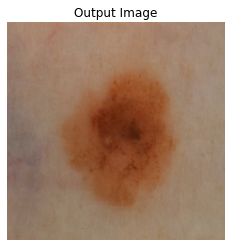

Iteration: Content Image 61 Style Image 6 completed.


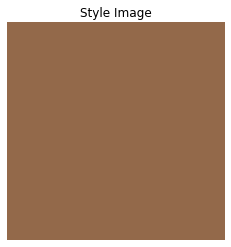

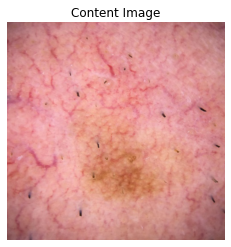

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.234257 Content Loss: 7.353733

run [1000]:
Style Loss : 8.507009 Content Loss: 7.430598

run [1500]:
Style Loss : 8.340381 Content Loss: 7.443130

run [2000]:
Style Loss : 8.296385 Content Loss: 7.424703



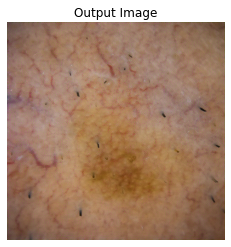

Iteration: Content Image 62 Style Image 6 completed.


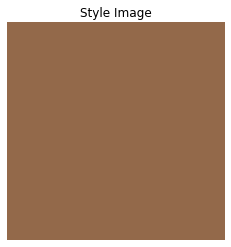

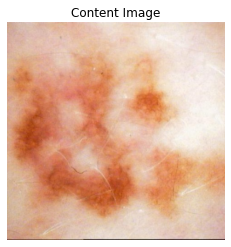

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 6.398619 Content Loss: 4.269129

run [1000]:
Style Loss : 6.186480 Content Loss: 4.303223

run [1500]:
Style Loss : 6.148665 Content Loss: 4.294482

run [2000]:
Style Loss : 6.135192 Content Loss: 4.285220



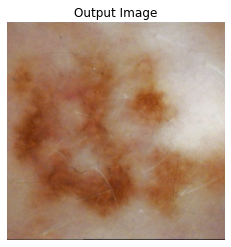

Iteration: Content Image 63 Style Image 6 completed.


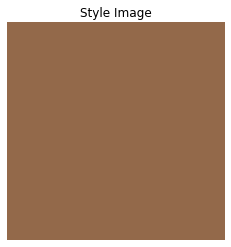

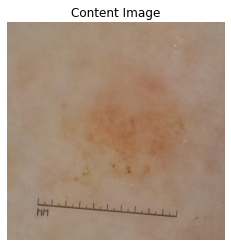

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 1.474907 Content Loss: 0.556166

run [1000]:
Style Loss : 1.414449 Content Loss: 0.567095

run [1500]:
Style Loss : 1.404797 Content Loss: 0.570016

run [2000]:
Style Loss : 1.400571 Content Loss: 0.570933



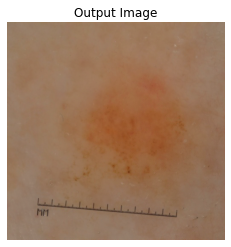

Iteration: Content Image 64 Style Image 6 completed.


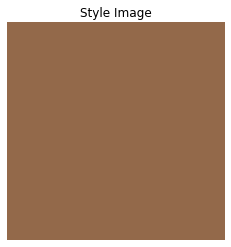

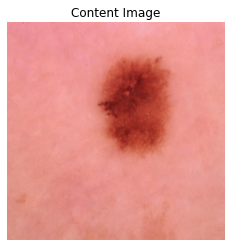

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.679865 Content Loss: 3.701819

run [1000]:
Style Loss : 3.165865 Content Loss: 3.779843

run [1500]:
Style Loss : 3.092204 Content Loss: 3.768223

run [2000]:
Style Loss : 3.069592 Content Loss: 3.757543



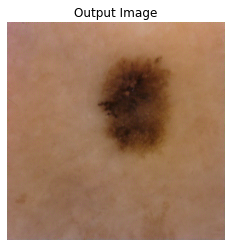

Iteration: Content Image 65 Style Image 6 completed.


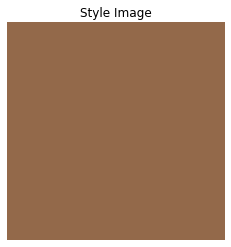

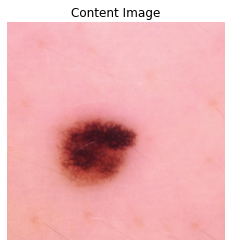

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.915467 Content Loss: 4.039922

run [1000]:
Style Loss : 2.763318 Content Loss: 3.987808

run [1500]:
Style Loss : 2.736200 Content Loss: 3.953923

run [2000]:
Style Loss : 2.710862 Content Loss: 3.942582



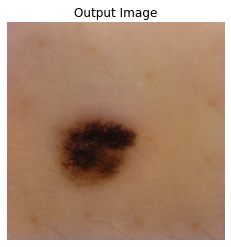

Iteration: Content Image 66 Style Image 6 completed.


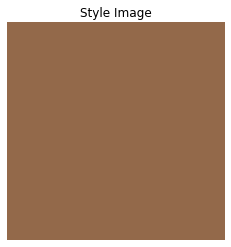

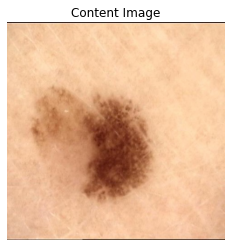

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.625631 Content Loss: 6.922512

run [1000]:
Style Loss : 13.695572 Content Loss: 18.963779

run [1500]:
Style Loss : 266.872711 Content Loss: 183.525558

run [2000]:
Style Loss :  nan Content Loss:  nan



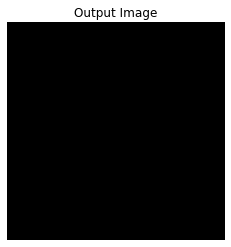

Iteration: Content Image 67 Style Image 6 completed.


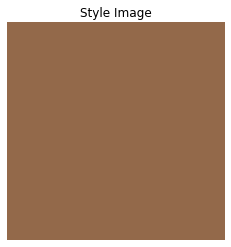

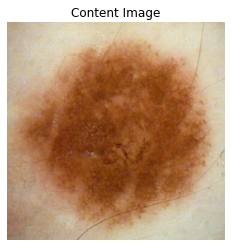

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.818628 Content Loss: 4.145371

run [1000]:
Style Loss : 7.528284 Content Loss: 4.202497

run [1500]:
Style Loss : 7.425036 Content Loss: 4.230677

run [2000]:
Style Loss : 7.382968 Content Loss: 4.241808



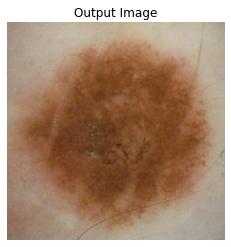

Iteration: Content Image 68 Style Image 6 completed.


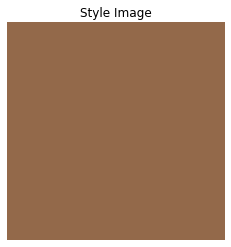

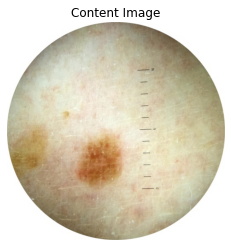

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.460000 Content Loss: 7.021882

run [1000]:
Style Loss : 9.424278 Content Loss: 6.571136

run [1500]:
Style Loss : 9.503973 Content Loss: 6.376869

run [2000]:
Style Loss : 9.492402 Content Loss: 6.389128



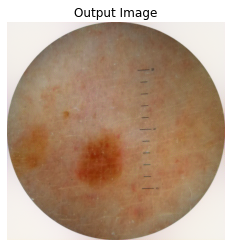

Iteration: Content Image 69 Style Image 6 completed.


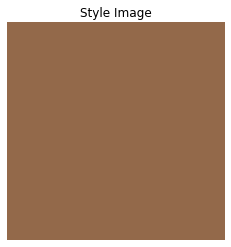

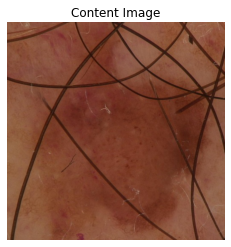

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 8.710143 Content Loss: 5.382301

run [1000]:
Style Loss : 8.684087 Content Loss: 5.349836

run [1500]:
Style Loss : 8.654633 Content Loss: 5.336546

run [2000]:
Style Loss : 8.630760 Content Loss: 5.327702



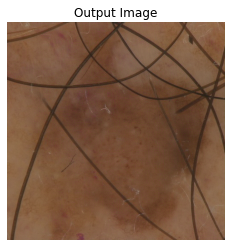

Iteration: Content Image 70 Style Image 6 completed.


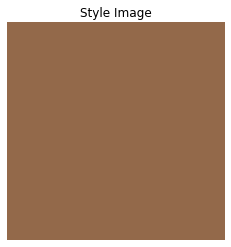

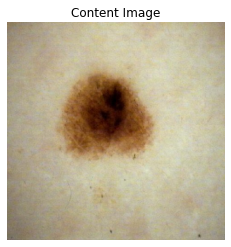

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 5.351271 Content Loss: 2.907543

run [1000]:
Style Loss : 5.088405 Content Loss: 2.876006

run [1500]:
Style Loss : 5.048136 Content Loss: 2.865956

run [2000]:
Style Loss : 5.029341 Content Loss: 2.864173



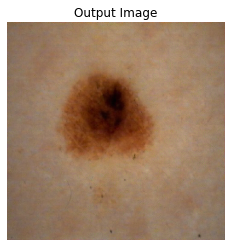

Iteration: Content Image 71 Style Image 6 completed.


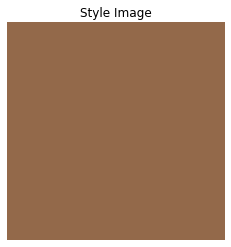

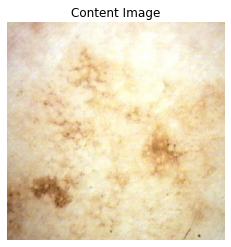

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.459702 Content Loss: 8.537410

run [1000]:
Style Loss : 9.233830 Content Loss: 8.485672

run [1500]:
Style Loss : 9.176790 Content Loss: 8.418939

run [2000]:
Style Loss : 9.151393 Content Loss: 8.367352



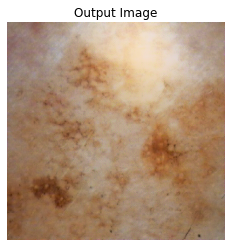

Iteration: Content Image 72 Style Image 6 completed.


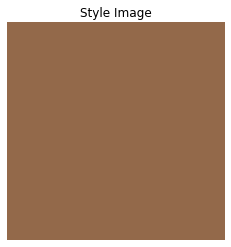

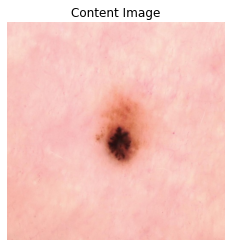

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.235178 Content Loss: 3.799312

run [1000]:
Style Loss : 2.195622 Content Loss: 3.723452

run [1500]:
Style Loss : 2.178617 Content Loss: 3.695815

run [2000]:
Style Loss : 2.179896 Content Loss: 3.670458



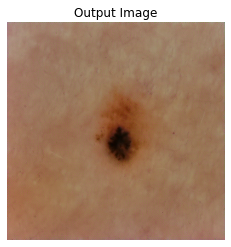

Iteration: Content Image 73 Style Image 6 completed.


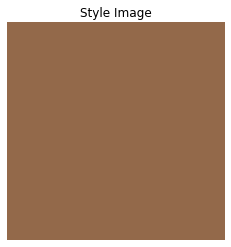

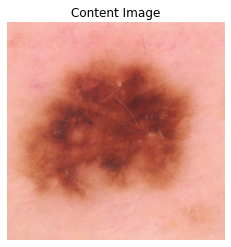

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.249638 Content Loss: 3.384831

run [1000]:
Style Loss : 3.998730 Content Loss: 3.416276

run [1500]:
Style Loss : 3.974457 Content Loss: 3.402074

run [2000]:
Style Loss : 3.962713 Content Loss: 3.394547



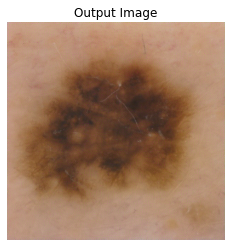

Iteration: Content Image 74 Style Image 6 completed.


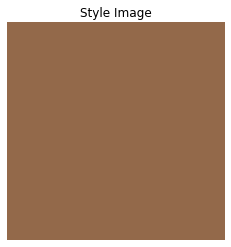

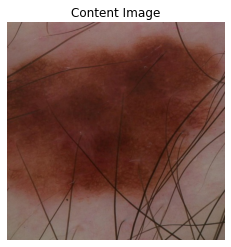

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.306910 Content Loss: 6.390682

run [1000]:
Style Loss : 9.102710 Content Loss: 6.415411

run [1500]:
Style Loss : 8.969330 Content Loss: 6.450634

run [2000]:
Style Loss : 8.896848 Content Loss: 6.471681



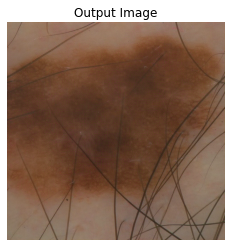

Iteration: Content Image 75 Style Image 6 completed.


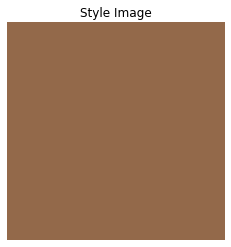

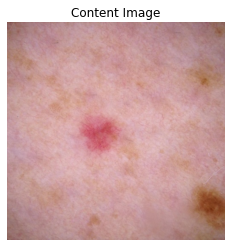

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.773075 Content Loss: 3.220222

run [1000]:
Style Loss : 4.489286 Content Loss: 3.198283

run [1500]:
Style Loss : 4.451576 Content Loss: 3.186215

run [2000]:
Style Loss : 4.432666 Content Loss: 3.180074



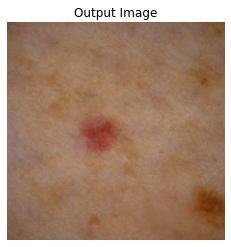

Iteration: Content Image 76 Style Image 6 completed.


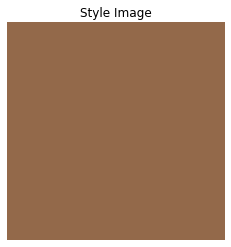

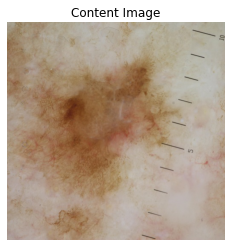

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 5.077627 Content Loss: 2.240328

run [1000]:
Style Loss : 4.808528 Content Loss: 2.253053

run [1500]:
Style Loss : 4.761973 Content Loss: 2.260106

run [2000]:
Style Loss : 4.740366 Content Loss: 2.267192



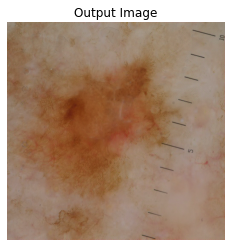

Iteration: Content Image 77 Style Image 6 completed.


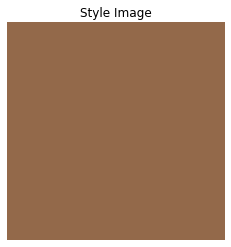

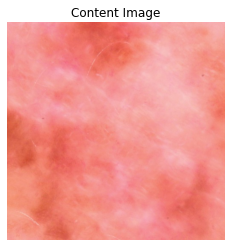

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.536083 Content Loss: 5.597179

run [1000]:
Style Loss : 3.843825 Content Loss: 5.650506

run [1500]:
Style Loss : 3.746376 Content Loss: 5.603846

run [2000]:
Style Loss : 3.716098 Content Loss: 5.575433



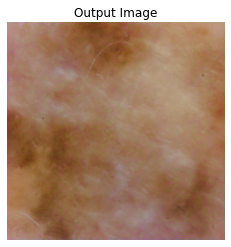

Iteration: Content Image 78 Style Image 6 completed.


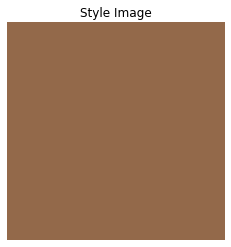

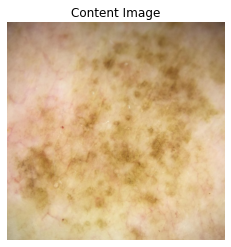

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.431394 Content Loss: 2.741698

run [1000]:
Style Loss : 4.312840 Content Loss: 2.729967

run [1500]:
Style Loss : 4.295688 Content Loss: 2.717811

run [2000]:
Style Loss : 4.287910 Content Loss: 2.710331



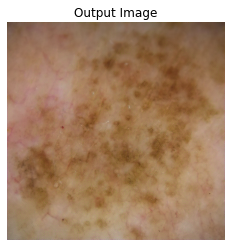

Iteration: Content Image 79 Style Image 6 completed.


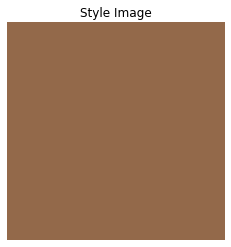

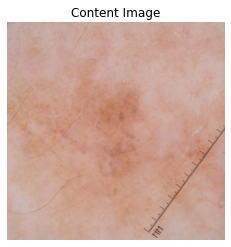

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.866118 Content Loss: 1.595296

run [1000]:
Style Loss : 2.835227 Content Loss: 1.567144

run [1500]:
Style Loss : 2.827037 Content Loss: 1.556703

run [2000]:
Style Loss : 2.819887 Content Loss: 1.552758



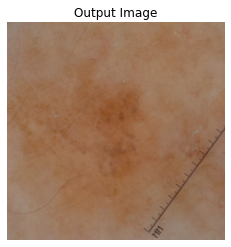

Iteration: Content Image 80 Style Image 6 completed.


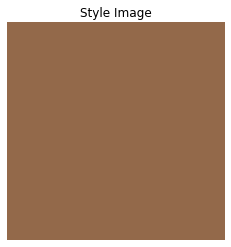

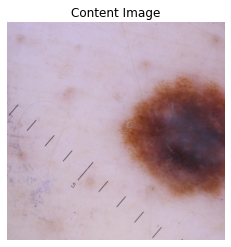

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.837878 Content Loss: 2.843368

run [1000]:
Style Loss : 3.747955 Content Loss: 2.788312

run [1500]:
Style Loss : 3.723048 Content Loss: 2.765957

run [2000]:
Style Loss : 3.712213 Content Loss: 2.754257



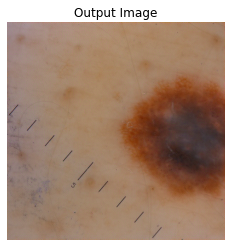

Iteration: Content Image 81 Style Image 6 completed.


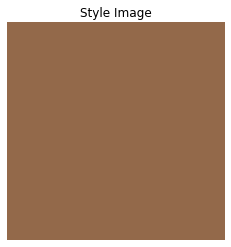

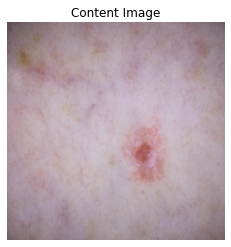

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.319356 Content Loss: 1.853799

run [1000]:
Style Loss : 2.258943 Content Loss: 1.817340

run [1500]:
Style Loss : 2.247126 Content Loss: 1.805278

run [2000]:
Style Loss : 2.236515 Content Loss: 1.802553



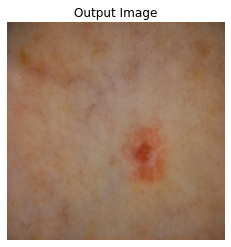

Iteration: Content Image 82 Style Image 6 completed.


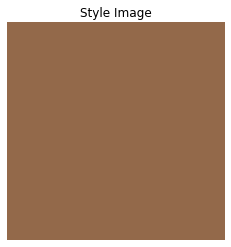

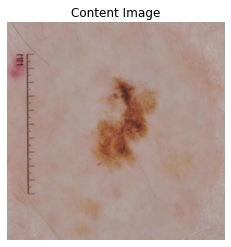

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.004190 Content Loss: 0.912912

run [1000]:
Style Loss : 1.955980 Content Loss: 0.906853

run [1500]:
Style Loss : 1.947000 Content Loss: 0.905820

run [2000]:
Style Loss : 1.942608 Content Loss: 0.905082



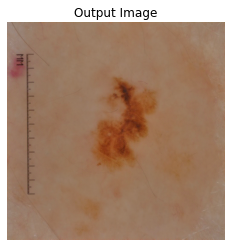

Iteration: Content Image 83 Style Image 6 completed.


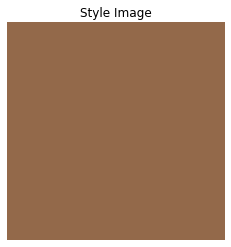

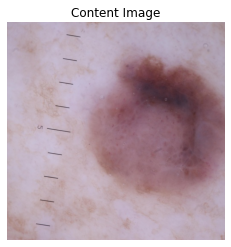

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.668384 Content Loss: 2.027394

run [1000]:
Style Loss : 2.582416 Content Loss: 2.000734

run [1500]:
Style Loss : 2.556194 Content Loss: 2.000003

run [2000]:
Style Loss : 2.545221 Content Loss: 1.998206



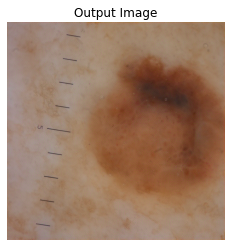

Iteration: Content Image 84 Style Image 6 completed.


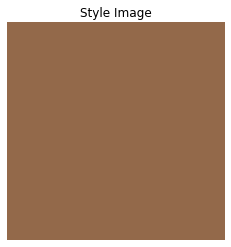

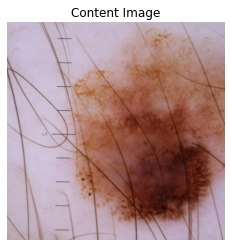

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 10.357654 Content Loss: 6.958737

run [1000]:
Style Loss : 9.911545 Content Loss: 7.000691

run [1500]:
Style Loss : 9.766155 Content Loss: 6.985427

run [2000]:
Style Loss : 9.697506 Content Loss: 6.972661



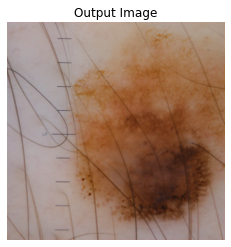

Iteration: Content Image 85 Style Image 6 completed.


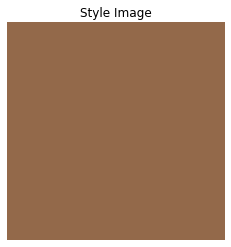

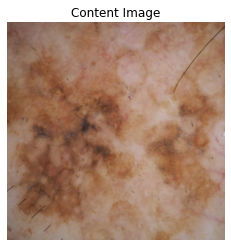

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.776669 Content Loss: 2.104418

run [1000]:
Style Loss : 4.696452 Content Loss: 2.111395

run [1500]:
Style Loss : 4.642223 Content Loss: 2.106298

run [2000]:
Style Loss : 4.624401 Content Loss: 2.101408



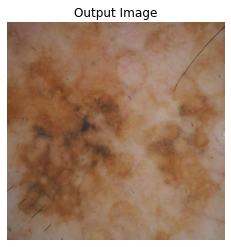

Iteration: Content Image 86 Style Image 6 completed.


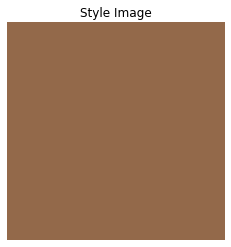

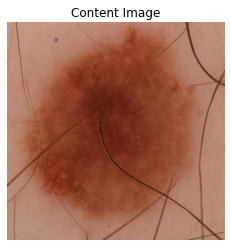

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 5.408123 Content Loss: 3.131447

run [1000]:
Style Loss : 5.398060 Content Loss: 3.092758

run [1500]:
Style Loss : 5.392870 Content Loss: 3.068568

run [2000]:
Style Loss : 5.382495 Content Loss: 3.057408



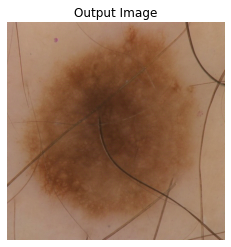

Iteration: Content Image 87 Style Image 6 completed.


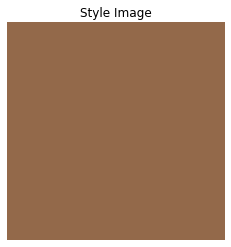

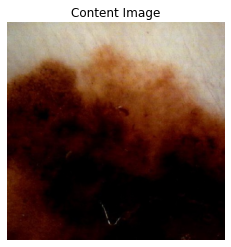

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.954952 Content Loss: 4.670961

run [1000]:
Style Loss : 7.534428 Content Loss: 4.869915

run [1500]:
Style Loss : 7.426874 Content Loss: 4.905225

run [2000]:
Style Loss : 7.364463 Content Loss: 4.923048



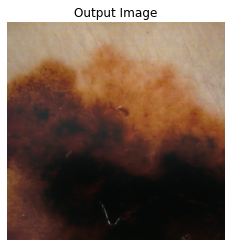

Iteration: Content Image 88 Style Image 6 completed.


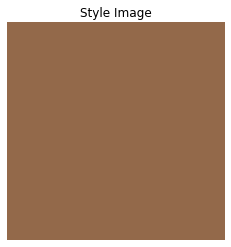

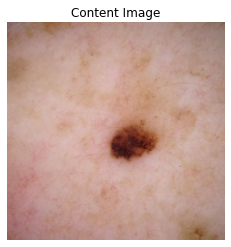

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.783247 Content Loss: 1.430245

run [1000]:
Style Loss : 2.738276 Content Loss: 1.414117

run [1500]:
Style Loss : 2.725450 Content Loss: 1.408702

run [2000]:
Style Loss : 2.718588 Content Loss: 1.405275



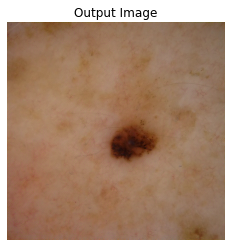

Iteration: Content Image 89 Style Image 6 completed.


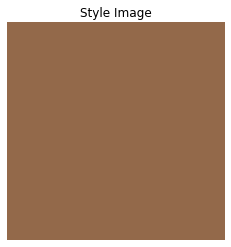

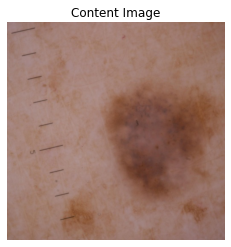

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 1.829153 Content Loss: 0.753076

run [1000]:
Style Loss : 1.790697 Content Loss: 0.736953

run [1500]:
Style Loss : 1.767717 Content Loss: 0.735303

run [2000]:
Style Loss : 1.755971 Content Loss: 0.736363



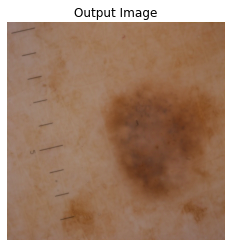

Iteration: Content Image 90 Style Image 6 completed.


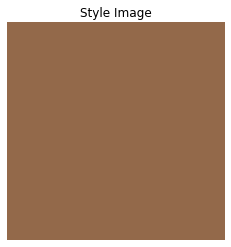

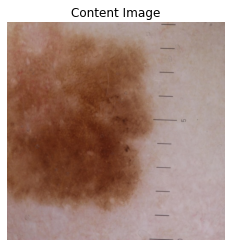

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.449965 Content Loss: 1.376689

run [1000]:
Style Loss : 3.367799 Content Loss: 1.396369

run [1500]:
Style Loss : 3.329593 Content Loss: 1.397625

run [2000]:
Style Loss : 3.305576 Content Loss: 1.398912



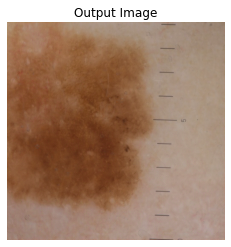

Iteration: Content Image 91 Style Image 6 completed.


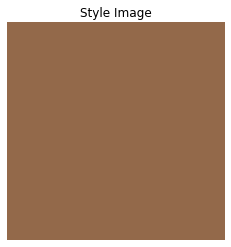

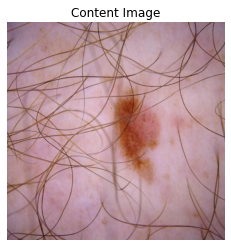

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 20.947641 Content Loss: 20.640100

run [1000]:
Style Loss : 20.450754 Content Loss: 20.586105

run [1500]:
Style Loss : 20.149933 Content Loss: 20.583780

run [2000]:
Style Loss : 19.886581 Content Loss: 20.555882



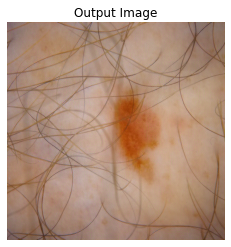

Iteration: Content Image 92 Style Image 6 completed.


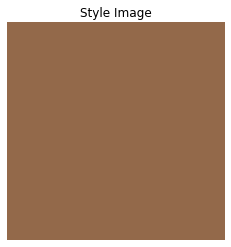

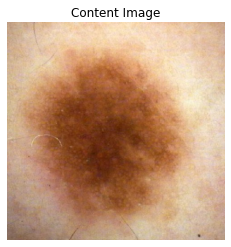

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.931987 Content Loss: 4.327471

run [1000]:
Style Loss : 7.425573 Content Loss: 4.462327

run [1500]:
Style Loss : 7.302353 Content Loss: 4.494022

run [2000]:
Style Loss : 7.254696 Content Loss: 4.505262



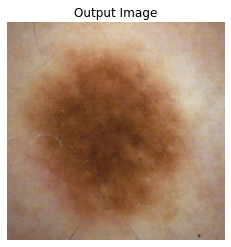

Iteration: Content Image 93 Style Image 6 completed.


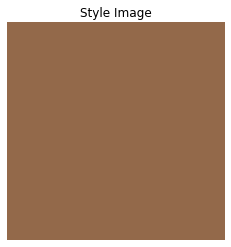

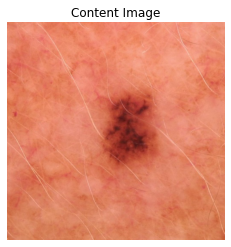

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.979834 Content Loss: 7.087550

run [1000]:
Style Loss : 7.795055 Content Loss: 6.886893

run [1500]:
Style Loss : 7.525120 Content Loss: 6.848475

run [2000]:
Style Loss : 7.396653 Content Loss: 6.839500



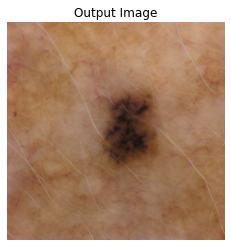

Iteration: Content Image 94 Style Image 6 completed.


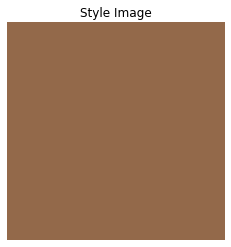

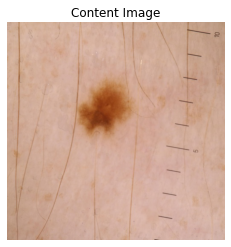

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.333366 Content Loss: 1.860518

run [1000]:
Style Loss : 3.302278 Content Loss: 1.831656

run [1500]:
Style Loss : 3.294701 Content Loss: 1.822013

run [2000]:
Style Loss : 3.287679 Content Loss: 1.818718



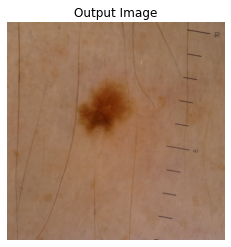

Iteration: Content Image 95 Style Image 6 completed.


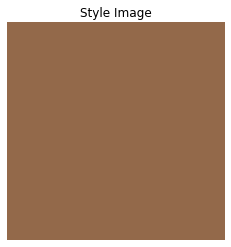

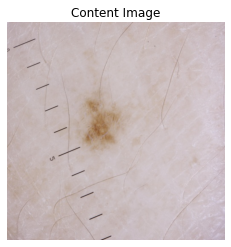

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.237844 Content Loss: 2.998262

run [1000]:
Style Loss : 4.186267 Content Loss: 2.973006

run [1500]:
Style Loss : 4.163556 Content Loss: 2.964056

run [2000]:
Style Loss : 4.146157 Content Loss: 2.960288



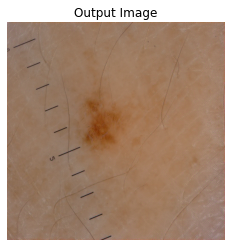

Iteration: Content Image 96 Style Image 6 completed.


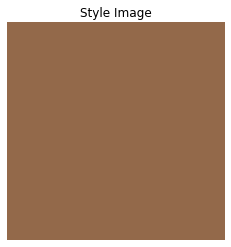

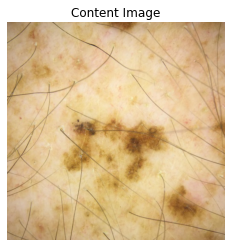

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 12.088829 Content Loss: 8.238269

run [1000]:
Style Loss : 11.141640 Content Loss: 8.341779

run [1500]:
Style Loss : 10.967784 Content Loss: 8.360922

run [2000]:
Style Loss : 10.887376 Content Loss: 8.371422



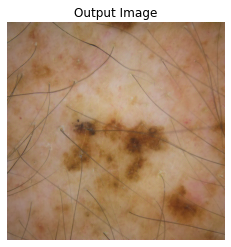

Iteration: Content Image 97 Style Image 6 completed.


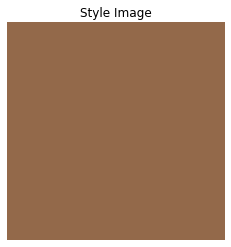

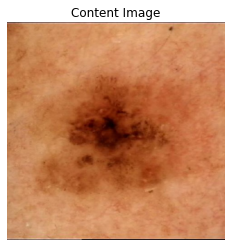

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 8.692863 Content Loss: 6.791670

run [1000]:
Style Loss : 8.624272 Content Loss: 6.689025

run [1500]:
Style Loss : 8.530167 Content Loss: 6.660070

run [2000]:
Style Loss : 8.471651 Content Loss: 6.653286



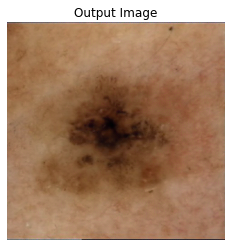

Iteration: Content Image 98 Style Image 6 completed.


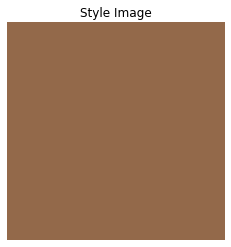

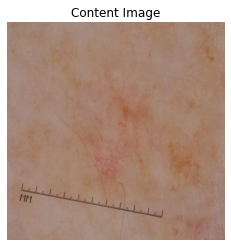

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 1.773694 Content Loss: 0.611146

run [1000]:
Style Loss : 1.691157 Content Loss: 0.623314

run [1500]:
Style Loss : 1.679063 Content Loss: 0.625533

run [2000]:
Style Loss : 1.674724 Content Loss: 0.625758



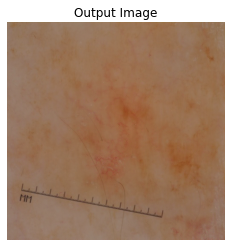

Iteration: Content Image 99 Style Image 6 completed.


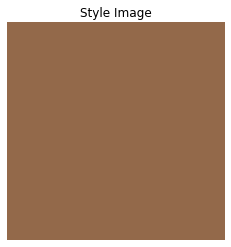

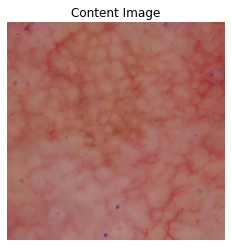

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.430814 Content Loss: 1.688661

run [1000]:
Style Loss : 2.389484 Content Loss: 1.644093

run [1500]:
Style Loss : 2.370150 Content Loss: 1.631612

run [2000]:
Style Loss : 2.363664 Content Loss: 1.623992



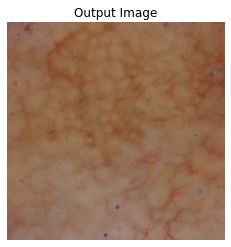

Iteration: Content Image 100 Style Image 6 completed.


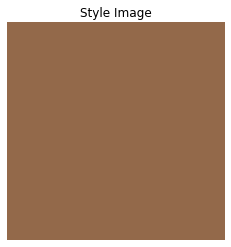

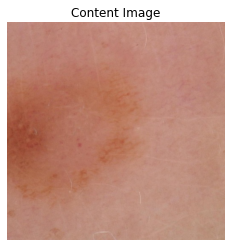

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.246018 Content Loss: 1.151661

run [1000]:
Style Loss : 2.119644 Content Loss: 1.150481

run [1500]:
Style Loss : 2.106347 Content Loss: 1.140671

run [2000]:
Style Loss : 2.101789 Content Loss: 1.135278



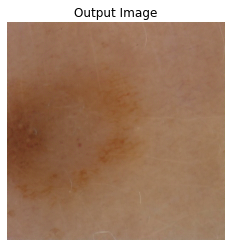

Iteration: Content Image 101 Style Image 6 completed.


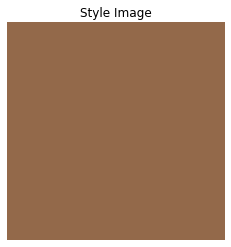

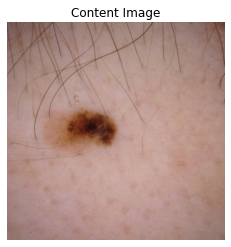

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.870862 Content Loss: 2.338495

run [1000]:
Style Loss : 4.410104 Content Loss: 2.397613

run [1500]:
Style Loss : 4.307816 Content Loss: 2.408197

run [2000]:
Style Loss : 4.278870 Content Loss: 2.408770



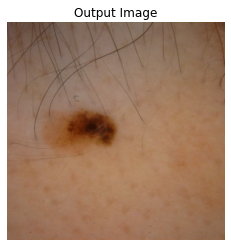

Iteration: Content Image 102 Style Image 6 completed.


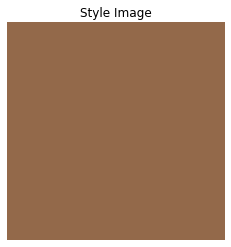

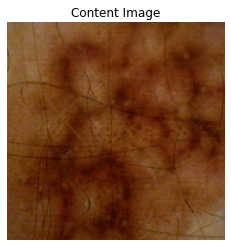

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 7.839942 Content Loss: 4.784181

run [1000]:
Style Loss : 7.574664 Content Loss: 4.867482

run [1500]:
Style Loss : 7.506443 Content Loss: 4.892764

run [2000]:
Style Loss : 7.476567 Content Loss: 4.903307



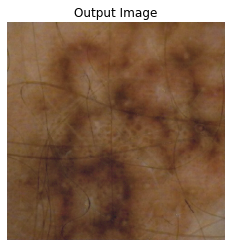

Iteration: Content Image 103 Style Image 6 completed.


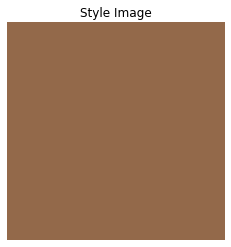

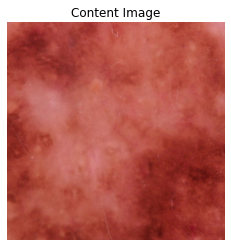

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.609070 Content Loss: 4.875833

run [1000]:
Style Loss : 4.634570 Content Loss: 4.722923

run [1500]:
Style Loss : 4.645621 Content Loss: 4.647783

run [2000]:
Style Loss : 4.653402 Content Loss: 4.601758



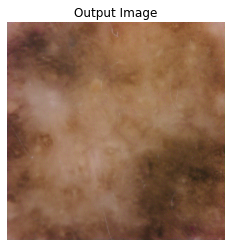

Iteration: Content Image 104 Style Image 6 completed.


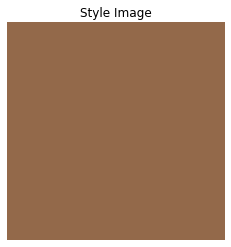

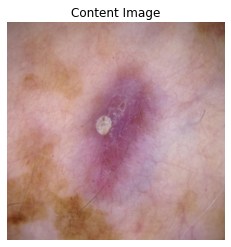

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.694986 Content Loss: 2.142273

run [1000]:
Style Loss : 3.516147 Content Loss: 2.126228

run [1500]:
Style Loss : 3.484360 Content Loss: 2.121846

run [2000]:
Style Loss : 3.470077 Content Loss: 2.119392



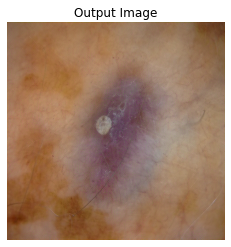

Iteration: Content Image 105 Style Image 6 completed.


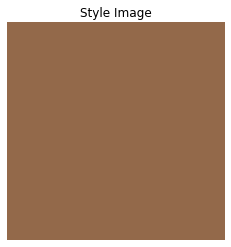

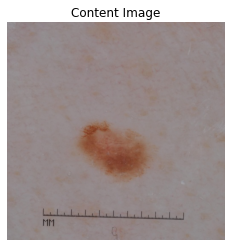

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.047795 Content Loss: 1.137835

run [1000]:
Style Loss : 1.927676 Content Loss: 1.151262

run [1500]:
Style Loss : 1.911353 Content Loss: 1.151155

run [2000]:
Style Loss : 1.904034 Content Loss: 1.151817



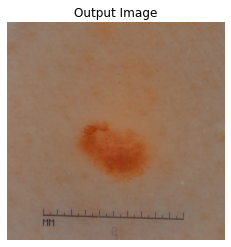

Iteration: Content Image 106 Style Image 6 completed.


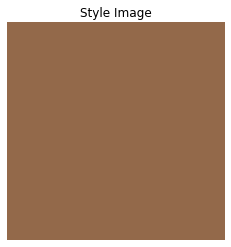

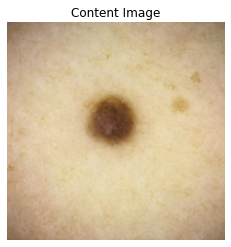

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.462195 Content Loss: 2.210318

run [1000]:
Style Loss : 3.399550 Content Loss: 2.154366

run [1500]:
Style Loss : 3.387334 Content Loss: 2.136364

run [2000]:
Style Loss : 3.377995 Content Loss: 2.128974



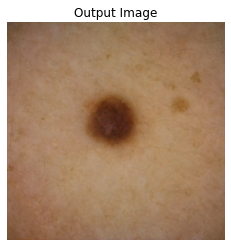

Iteration: Content Image 107 Style Image 6 completed.


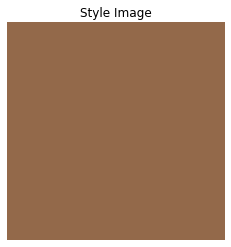

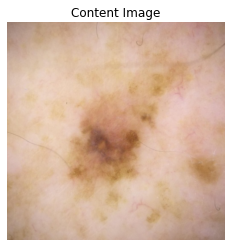

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.011753 Content Loss: 1.192539

run [1000]:
Style Loss : 1.997706 Content Loss: 1.159477

run [1500]:
Style Loss : 1.990289 Content Loss: 1.151891

run [2000]:
Style Loss : 1.983828 Content Loss: 1.149531



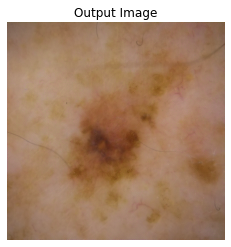

Iteration: Content Image 108 Style Image 6 completed.


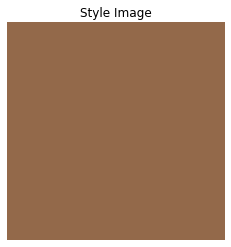

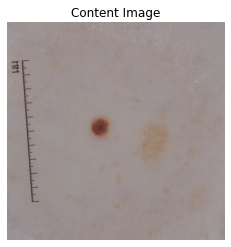

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 2.043124 Content Loss: 1.449460

run [1000]:
Style Loss : 1.931084 Content Loss: 1.454214

run [1500]:
Style Loss : 1.922800 Content Loss: 1.447709

run [2000]:
Style Loss : 1.918303 Content Loss: 1.444891



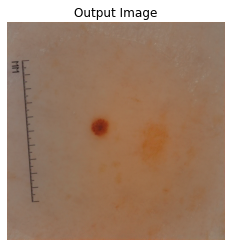

Iteration: Content Image 109 Style Image 6 completed.


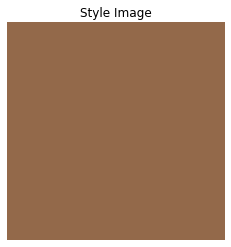

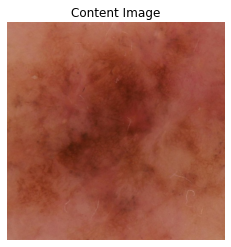

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.484643 Content Loss: 2.544755

run [1000]:
Style Loss : 3.499460 Content Loss: 2.483094

run [1500]:
Style Loss : 3.499082 Content Loss: 2.461419

run [2000]:
Style Loss : 3.498923 Content Loss: 2.447413



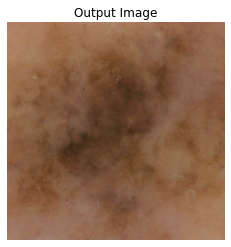

Iteration: Content Image 110 Style Image 6 completed.


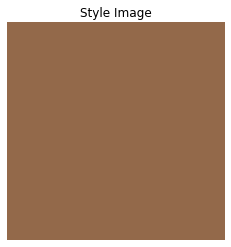

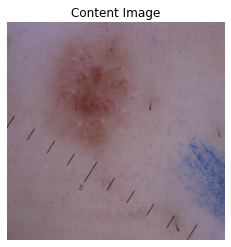

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.456153 Content Loss: 2.268012

run [1000]:
Style Loss : 3.400238 Content Loss: 2.230155

run [1500]:
Style Loss : 3.369931 Content Loss: 2.212130

run [2000]:
Style Loss : 3.349902 Content Loss: 2.205931



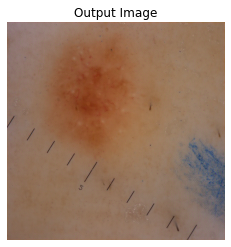

Iteration: Content Image 111 Style Image 6 completed.


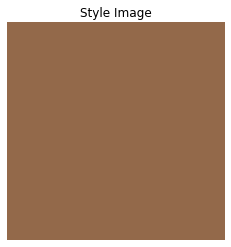

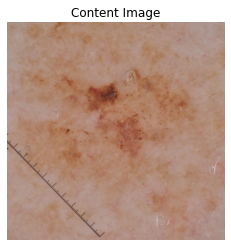

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.915798 Content Loss: 2.076232

run [1000]:
Style Loss : 4.584926 Content Loss: 2.097839

run [1500]:
Style Loss : 4.543940 Content Loss: 2.094024

run [2000]:
Style Loss : 4.523709 Content Loss: 2.097355



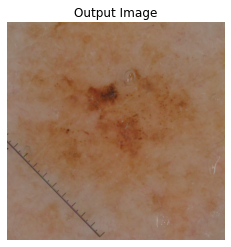

Iteration: Content Image 112 Style Image 6 completed.


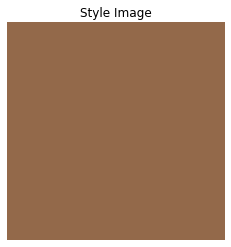

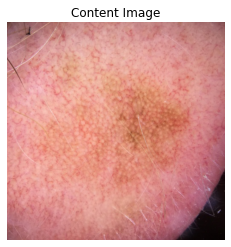

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 12.340587 Content Loss: 9.889701

run [1000]:
Style Loss : 11.662909 Content Loss: 9.778274

run [1500]:
Style Loss : 11.321001 Content Loss: 9.848369

run [2000]:
Style Loss : 11.181545 Content Loss: 9.862006



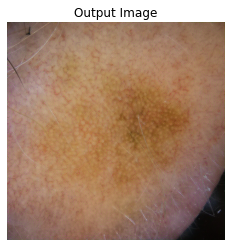

Iteration: Content Image 113 Style Image 6 completed.


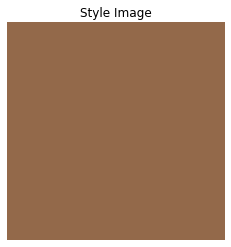

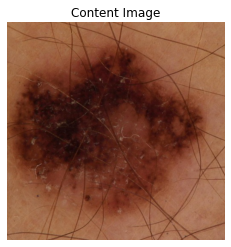

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.903290 Content Loss: 6.293002

run [1000]:
Style Loss : 9.863581 Content Loss: 6.265194

run [1500]:
Style Loss : 9.825595 Content Loss: 6.259497

run [2000]:
Style Loss : 9.789759 Content Loss: 6.264248



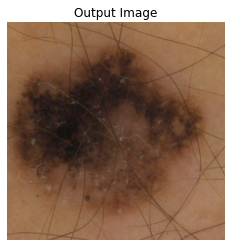

Iteration: Content Image 114 Style Image 6 completed.


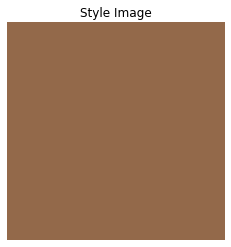

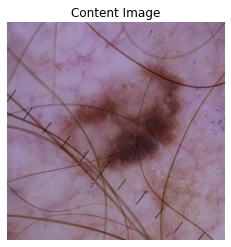

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 10.431710 Content Loss: 8.075834

run [1000]:
Style Loss : 10.283243 Content Loss: 8.058230

run [1500]:
Style Loss : 10.224410 Content Loss: 8.012736

run [2000]:
Style Loss : 10.185416 Content Loss: 7.973645



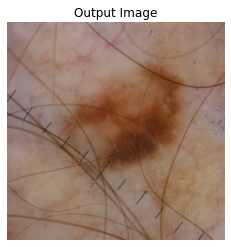

Iteration: Content Image 115 Style Image 6 completed.


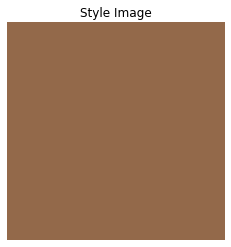

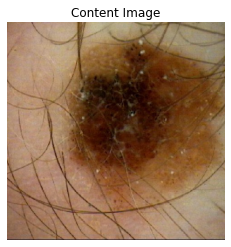

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 13.314687 Content Loss: 8.892846

run [1000]:
Style Loss : 13.252091 Content Loss: 8.871168

run [1500]:
Style Loss : 13.195910 Content Loss: 8.861664

run [2000]:
Style Loss : 13.155322 Content Loss: 8.857141



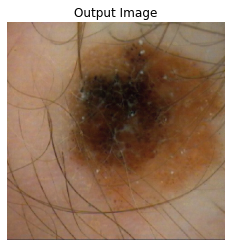

Iteration: Content Image 116 Style Image 6 completed.


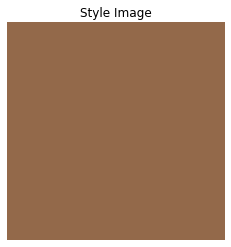

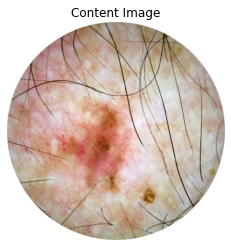

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 24.392208 Content Loss: 24.852417

run [1000]:
Style Loss : 22.655937 Content Loss: 25.159582

run [1500]:
Style Loss : 22.377367 Content Loss: 24.946575

run [2000]:
Style Loss : 22.343988 Content Loss: 24.826601



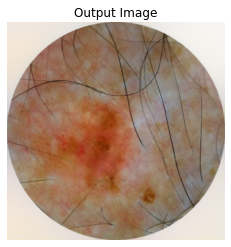

Iteration: Content Image 117 Style Image 6 completed.


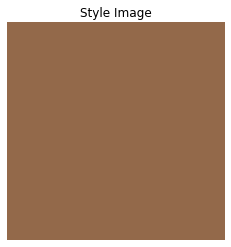

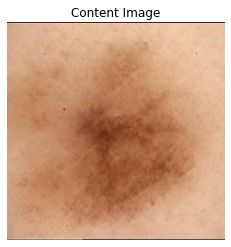

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 6.157739 Content Loss: 4.124653

run [1000]:
Style Loss : 6.448970 Content Loss: 5.955315

run [1500]:
Style Loss :  nan Content Loss:  nan

run [2000]:
Style Loss :  nan Content Loss:  nan



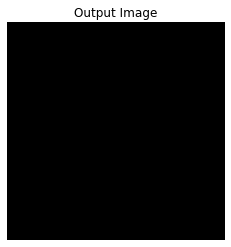

Iteration: Content Image 118 Style Image 6 completed.


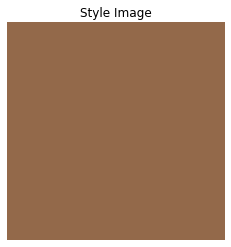

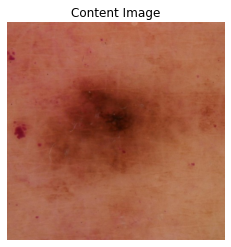

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.201945 Content Loss: 2.103371

run [1000]:
Style Loss : 3.208273 Content Loss: 2.046599

run [1500]:
Style Loss : 3.204458 Content Loss: 2.024318

run [2000]:
Style Loss : 3.201282 Content Loss: 2.011879



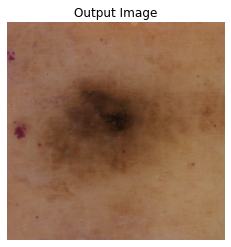

Iteration: Content Image 119 Style Image 6 completed.


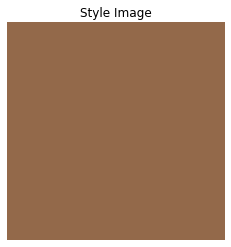

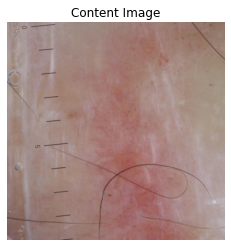

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.237105 Content Loss: 1.376559

run [1000]:
Style Loss : 3.070859 Content Loss: 1.391148

run [1500]:
Style Loss : 3.039813 Content Loss: 1.394360

run [2000]:
Style Loss : 3.029861 Content Loss: 1.393870



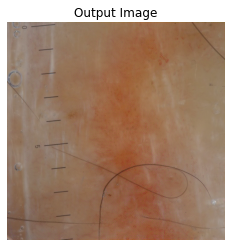

Iteration: Content Image 120 Style Image 6 completed.


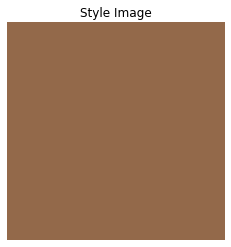

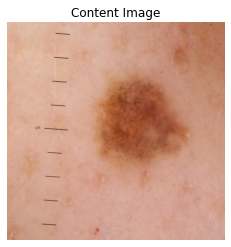

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 3.117543 Content Loss: 1.662022

run [1000]:
Style Loss : 3.055056 Content Loss: 1.647893

run [1500]:
Style Loss : 3.047879 Content Loss: 1.636589

run [2000]:
Style Loss : 3.043567 Content Loss: 1.631051



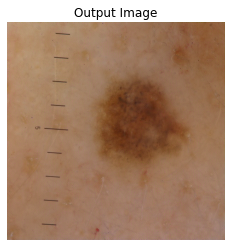

Iteration: Content Image 121 Style Image 6 completed.


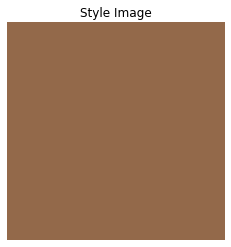

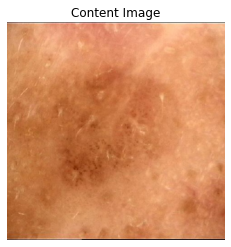

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.147170 Content Loss: 7.059578

run [1000]:
Style Loss : 8.920185 Content Loss: 6.975624

run [1500]:
Style Loss : 8.713565 Content Loss: 6.993817

run [2000]:
Style Loss : 8.616103 Content Loss: 7.025675



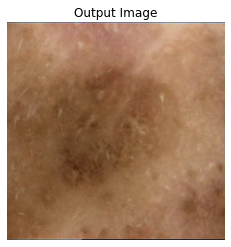

Iteration: Content Image 122 Style Image 6 completed.


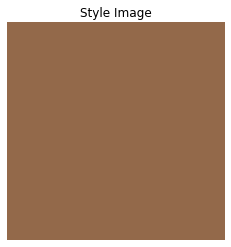

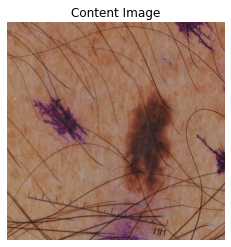

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 19.645813 Content Loss: 18.441156

run [1000]:
Style Loss : 19.554771 Content Loss: 18.354733

run [1500]:
Style Loss : 19.493155 Content Loss: 18.292133

run [2000]:
Style Loss : 19.443535 Content Loss: 18.243963



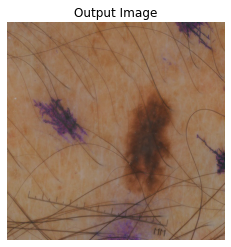

Iteration: Content Image 123 Style Image 6 completed.


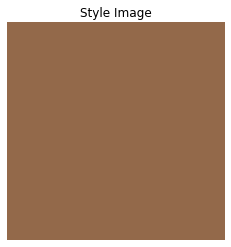

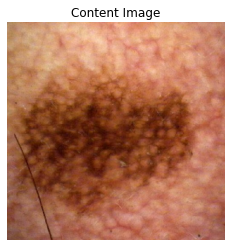

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 9.658825 Content Loss: 6.421592

run [1000]:
Style Loss : 9.632246 Content Loss: 6.358971

run [1500]:
Style Loss : 9.611230 Content Loss: 6.322912

run [2000]:
Style Loss : 9.588768 Content Loss: 6.304782



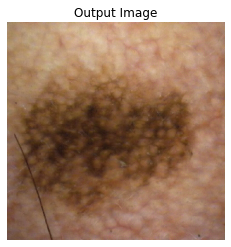

Iteration: Content Image 124 Style Image 6 completed.


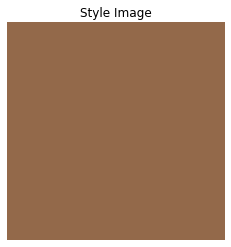

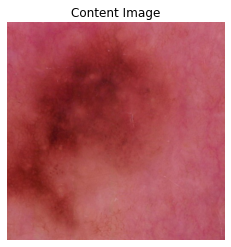

Building the style transfer model..
Optimizing..
run [500]:
Style Loss : 4.271609 Content Loss: 5.586672

run [1000]:
Style Loss : 4.329184 Content Loss: 5.391714

run [1500]:
Style Loss : 4.341400 Content Loss: 5.317150



In [ ]:
main()


*   263 images based on style 1
*   112 images based on style 3
*   124 images based on style 6

